In [1]:
# Import packages

import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

In [12]:
import pandas as pd

#Export AZ, ELEV and SNR from RTKLIB to a txt file
# read text file into pandas DataFrame (extra white space)
GpsRoverFile = pd.read_fwf('Data/Data2/SNR_EL_MP_0degGPS_rover2_11_10.txt')
# GloRoverFile = pd.read_fwf('Data/Data2/SNR_EL_MP_0degGLO_rover2_11_10.txt')

GalRoverFile = pd.read_fwf('Data/Data2/SNR_EL_MP_0degGAL_rover2_11_10.txt')

# BDSRoverFile = pd.read_fwf('Data/Data2/SNR_EL_MP_0degBDS_rover2_11_10.txt')
GpsRoverFile.head()

,% TIME (GPST),SAT,AZ(deg),EL(deg),SNR(dBHz),L1/LC MP(m)
0,2022/11/10 11:00:18.4,G03,122.5,9.9,27.1,0.0
1,2022/11/10 11:00:21.4,G03,122.5,9.9,25.4,0.0
2,2022/11/10 11:00:23.4,G03,122.5,9.9,27.2,0.0
3,2022/11/10 11:00:24.4,G03,122.5,9.9,28.2,0.0
4,2022/11/10 11:00:26.4,G03,122.5,9.9,26.5,0.0


In [15]:
Gpaz = np.radians(GpsRoverFile['AZ(deg)'])
Gpel = GpsRoverFile['EL(deg)']
times = GpsRoverFile['% TIME (GPST)']
len(times)

# GloAz = np.radians(GloRoverFile['AZ(deg)'])
# GloEl = GloRoverFile['EL(deg)']

GalAz = np.radians(GalRoverFile['AZ(deg)'])
GalEl = GalRoverFile['EL(deg)']

# BDSAz = np.radians(BDSRoverFile['AZ(deg)'])
# BDSEl = BDSRoverFile['EL(deg)']

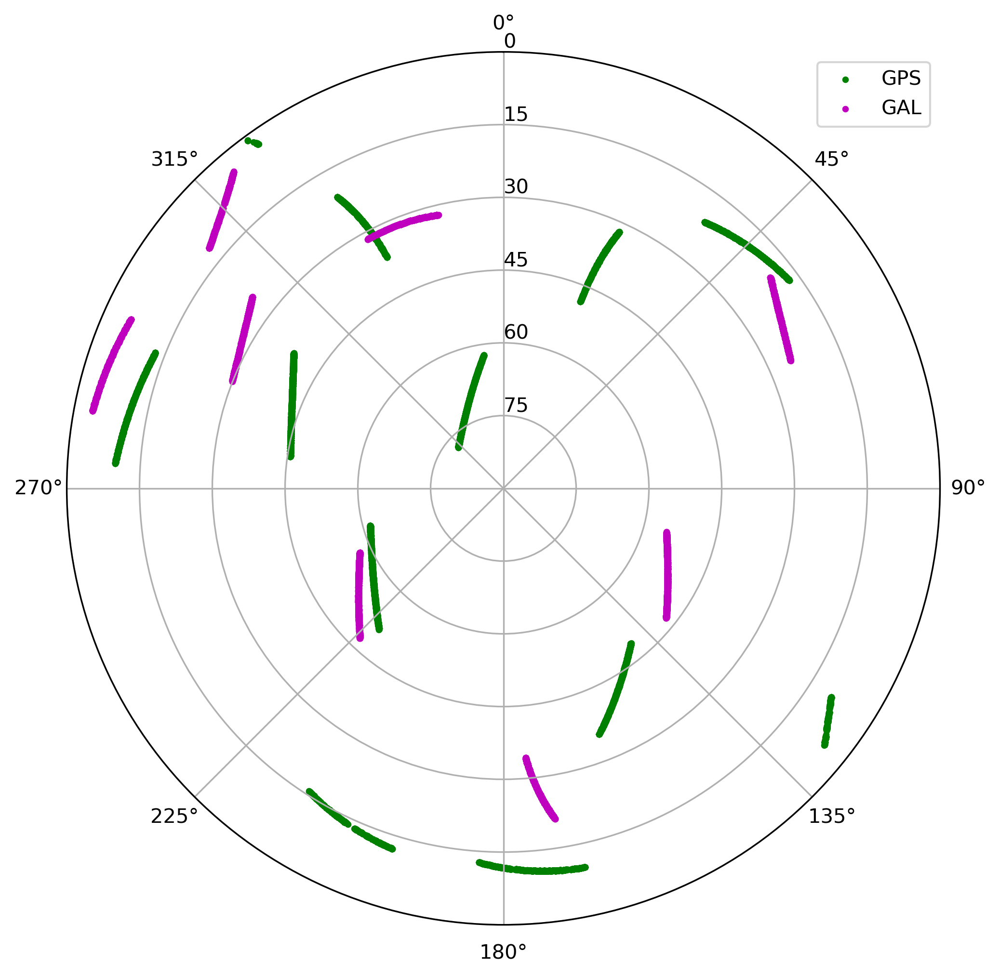

In [17]:
# Plot sky plot
fig = plt.figure(figsize=(8,8), dpi=300)

# Coordinate system to polar coordinate
ax = fig.add_subplot(111, projection='polar')

# Angle 0 starts from the North
ax.set_theta_zero_location('N')

# Change direction to clockwise
ax.set_theta_direction(-1)
ax.set_ylim(90, 0)
# Increase yticks by 15
ax.set_yticks(range(0, 90, 15))
# Set the position of the label to 0 
ax.set_rlabel_position(0)
plt.scatter(Gpaz, Gpel, s=5, c='g', marker='o', label='GPS')
# plt.scatter(GloAz, GloEl, s=5, c='r', marker='o', label='GLO')
plt.scatter(GalAz, GalEl, s=5, c='m', marker='o', label='GAL')
# plt.scatter(BDSAz, BDSEl, s=5, c='y', marker='o', label='BDS')
plt.legend(loc='best')
ax.grid(True)
plt.show()

In [18]:
# Import Satellite and DOP file for each constellation
SatDopFile = pd.read_fwf('Data\Data2\Rover2Sats_Dop_ALL11_10_0Elev.txt')
GpsSatDopFile = pd.read_fwf('Data\Data2\Rover2Sats_Dop_GPS11_10_0Elev.txt')
GloSatDopFile = pd.read_fwf('Data\Data2\Rover2Sats_Dop_GLO11_10_0Elev.txt')
BdsSatDopFile = pd.read_fwf('Data\Data2\Rover2Sats_Dop_BDS11_10_0Elev.txt')
GalSatDopFile = pd.read_fwf('Data\Data2\Rover2Sats_Dop_GAL11_10_0Elev.txt')
SatDopFile.head()

,% TIME (GPST),NSAT,GDOP,PDOP,HDOP,VDOP,(EL>=0deg)
0,2022/11/10 11:00:00.4,28,1.2,1.1,0.6,0.9,NaN
1,2022/11/10 11:00:01.4,28,1.2,1.1,0.6,0.9,NaN
2,2022/11/10 11:00:02.4,28,1.2,1.1,0.6,0.9,NaN
3,2022/11/10 11:00:03.4,26,1.3,1.1,0.6,1.0,NaN
4,2022/11/10 11:00:04.4,28,1.2,1.1,0.6,0.9,NaN


In [19]:
# Extract time column
SatTime = SatDopFile['% TIME (GPST)']

from datetime import datetime

# The format in which the string represents a date and time
date_format = "%Y/%m/%d %H:%M:%S.%f"

date_time = []
for i in range(len(SatTime)):
    # Convert the string to a datetime object
    date = datetime.strptime(SatTime[i], date_format)
    # Extract the time from the datetime object
    #date = date.strftime('%X')
    date_time.append(date)

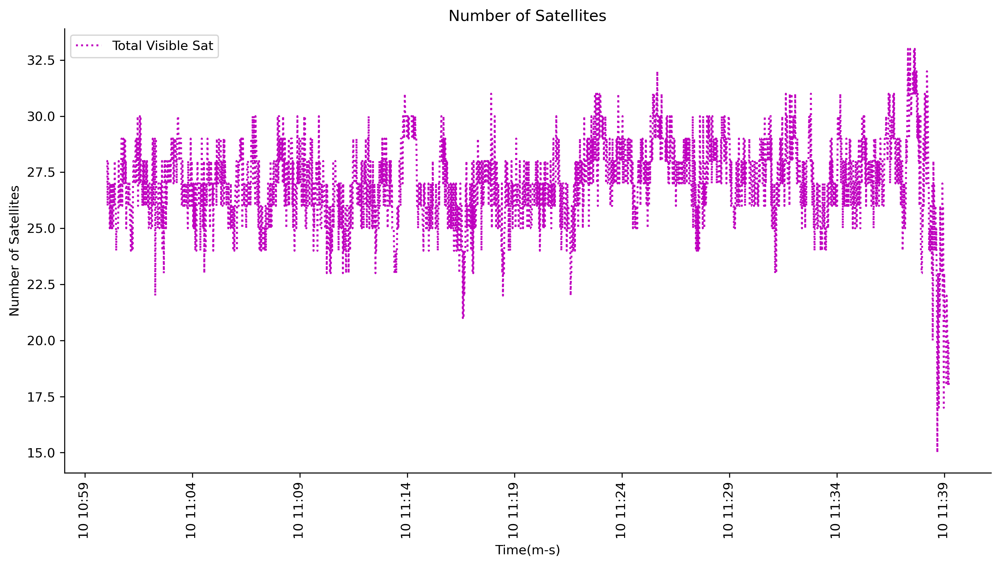

In [20]:
import matplotlib.dates as mdates

NumOfSat = SatDopFile['NSAT']
GpsNumOfSat = GpsSatDopFile['NSAT']
GloNumOfSat = GloSatDopFile['NSAT']
BdsNumOfSat = BdsSatDopFile['NSAT']
GalNumOfSat = GalSatDopFile['NSAT']

fig = plt.figure(figsize=(20,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.plot(date_time, NumOfSat, 'm:', label='Total Visible Sat' )

plt.title('Number of Satellites')
plt.xlabel('Time(m-s)')
plt.ylabel('Number of Satellites')
plt.legend(loc='best')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)
plt.show()

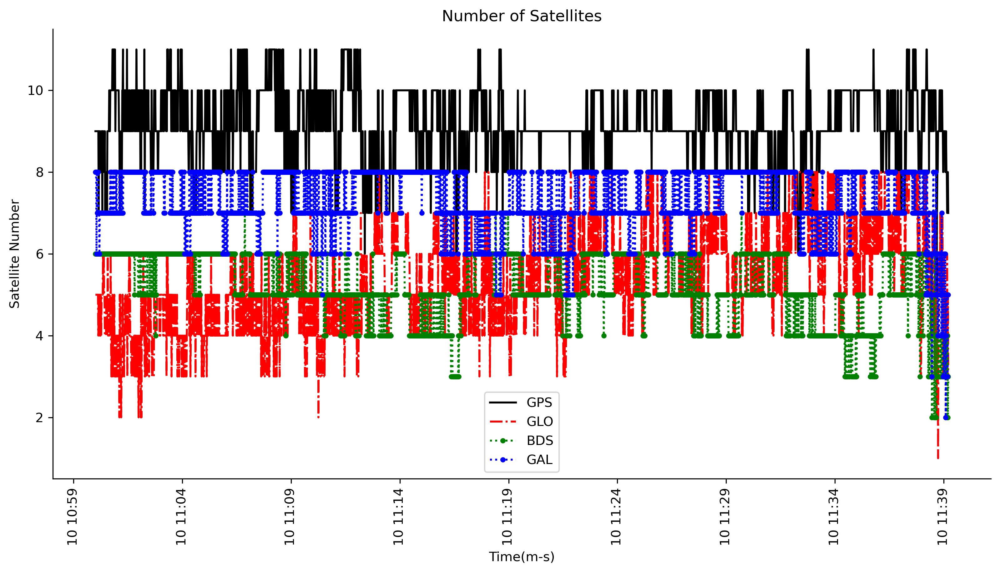

In [21]:
fig = plt.figure(figsize=(20,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.plot(date_time, GpsNumOfSat, 'k-', label='GPS' )
plt.plot(date_time, GloNumOfSat, 'r-.', label='GLO' )
plt.plot(date_time, BdsNumOfSat, 'g:.', label='BDS' )
plt.plot(date_time, GalNumOfSat, 'b:.', label='GAL' )

plt.title('Number of Satellites')
plt.xlabel('Time(m-s)')
plt.ylabel('Satellite Number')
plt.legend(loc='best')
# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)
plt.show()

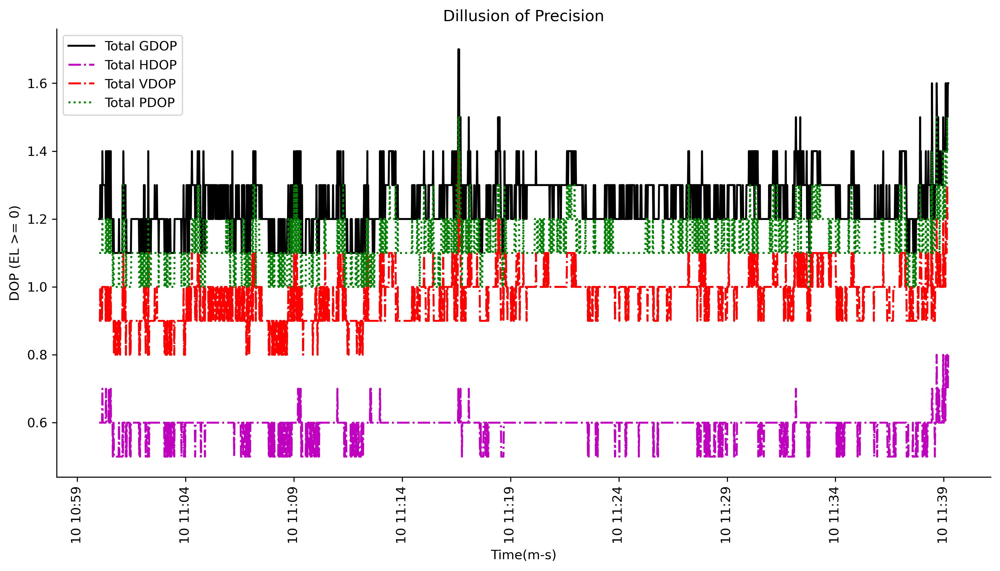

In [22]:

AllGDOP = SatDopFile['GDOP']
AllPDOP = SatDopFile['PDOP']
AllHDOP = SatDopFile['HDOP']
AllVDOP = SatDopFile['VDOP']

fig = plt.figure(figsize=(20,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.plot(date_time, AllGDOP, 'k-', label='Total GDOP' )
plt.plot(date_time, AllHDOP, 'm-.', label='Total HDOP' )
plt.plot(date_time, AllVDOP, 'r-.', label='Total VDOP' )
plt.plot(date_time, AllPDOP, 'g:', label='Total PDOP' )

plt.title('Dillusion of Precision')
plt.xlabel('Time(m-s)')
plt.ylabel('DOP (EL >= 0)')
plt.legend(loc='best')
# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)
plt.show()

### Rover Static Positioning 0 deg

In [25]:
# Rover data with 0 deg Elavation angle
RoverData_Elev0 = pd.read_fwf("Data\Data2\Rover2StaticObs11_10_0Elev.pos", skiprows = 13)
RoverData_Elev0.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042486,7.399337,478.5413,5,20,2.1055,2.1819,4.8007,0.7558,-1.3609,1.4734,0.0,0.0
1,2022/11/10,11:00:01.416,9.042517,7.399314,480.4416,5,20,2.1055,2.1818,4.8011,0.7558,-1.3609,1.4735,0.0,0.0
2,2022/11/10,11:00:02.416,9.042501,7.399351,477.4970,5,20,2.1055,2.1818,4.8015,0.7558,-1.3608,1.4736,0.0,0.0
3,2022/11/10,11:00:03.416,9.042522,7.399376,453.6370,5,18,2.1491,2.2862,5.0016,0.5582,-1.1433,1.2791,0.0,0.0
4,2022/11/10,11:00:04.416,9.042554,7.399346,478.7022,5,20,2.1055,2.1818,4.8023,0.7557,-1.3607,1.4738,0.0,0.0


In [26]:
RoverData_Elev0.rename(columns={'Unnamed: 1': 'time_1'}, inplace= True )
RoverData_Elev0.head()

,% GPST,time_1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042486,7.399337,478.5413,5,20,2.1055,2.1819,4.8007,0.7558,-1.3609,1.4734,0.0,0.0
1,2022/11/10,11:00:01.416,9.042517,7.399314,480.4416,5,20,2.1055,2.1818,4.8011,0.7558,-1.3609,1.4735,0.0,0.0
2,2022/11/10,11:00:02.416,9.042501,7.399351,477.4970,5,20,2.1055,2.1818,4.8015,0.7558,-1.3608,1.4736,0.0,0.0
3,2022/11/10,11:00:03.416,9.042522,7.399376,453.6370,5,18,2.1491,2.2862,5.0016,0.5582,-1.1433,1.2791,0.0,0.0
4,2022/11/10,11:00:04.416,9.042554,7.399346,478.7022,5,20,2.1055,2.1818,4.8023,0.7557,-1.3607,1.4738,0.0,0.0


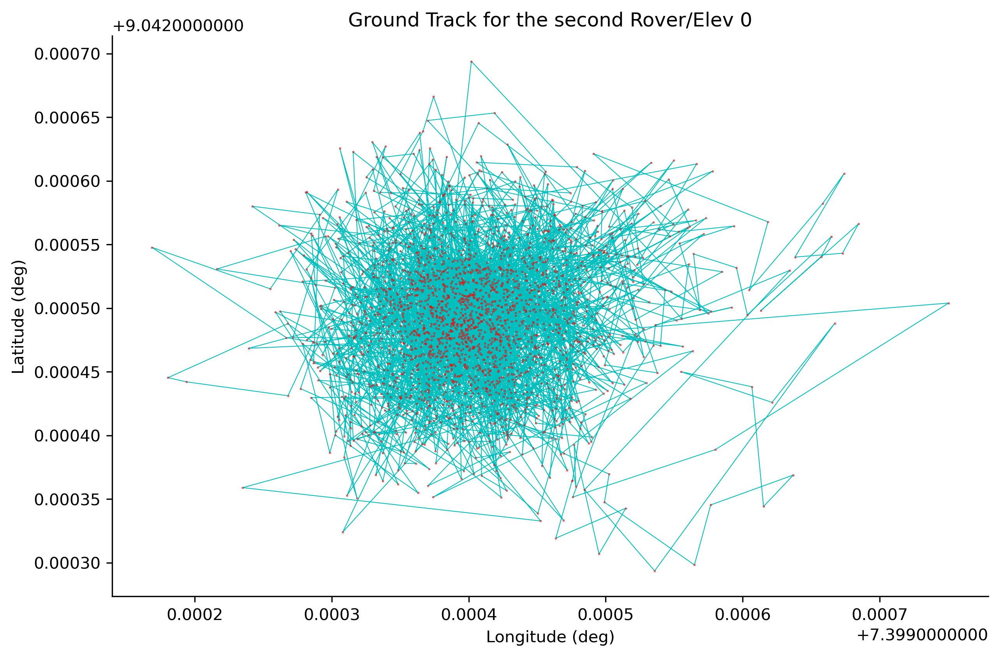

In [27]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(RoverData_Elev0['longitude(deg)'], RoverData_Elev0['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(RoverData_Elev0['longitude(deg)'], RoverData_Elev0['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
#plt.ylim(8.7, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the second Rover/Elev 0')

plt.show()

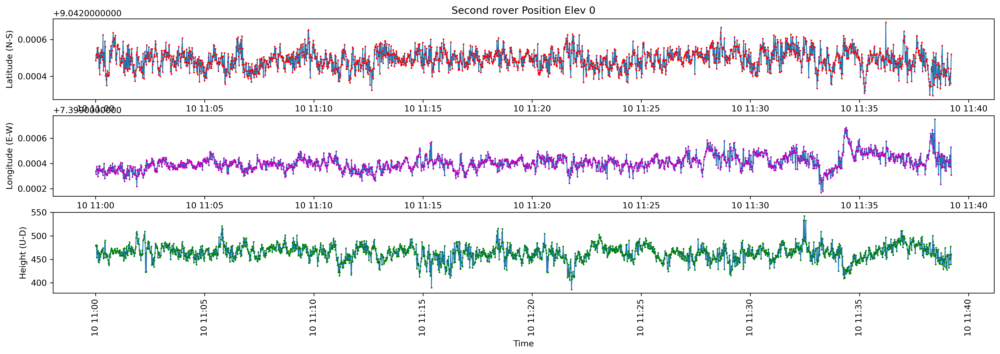

In [28]:
fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(date_time, RoverData_Elev0['latitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev0['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second rover Position Elev 0')


plt.subplot(3,1,2)
plt.plot(date_time, RoverData_Elev0['longitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev0['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(date_time, RoverData_Elev0['height(m)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev0['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

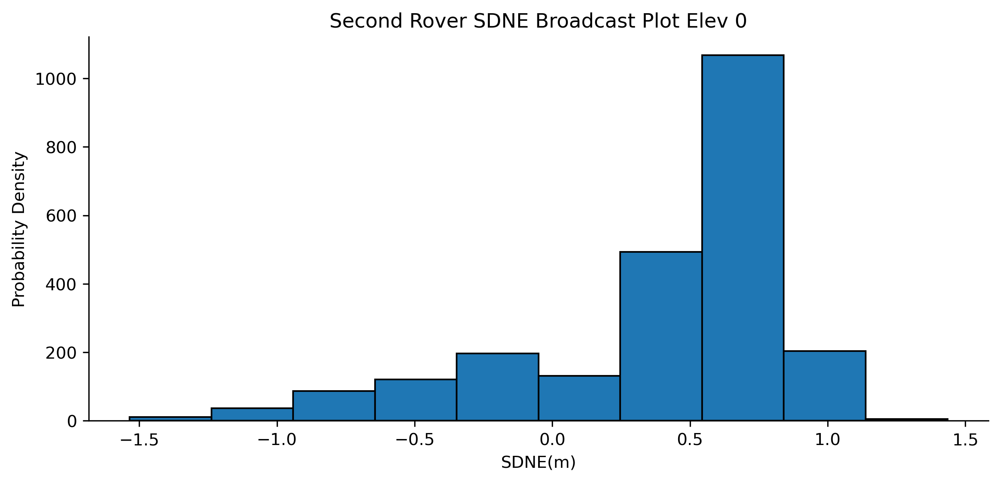

In [31]:
#import seaborn as sb
from scipy.stats import norm

mean = np.mean(RoverData_Elev0['sdne(m)'])
sd = np.std(RoverData_Elev0['sdne(m)'])
pdf = norm.pdf(RoverData_Elev0['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(RoverData_Elev0['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Rover SDNE Broadcast Plot Elev 0')

plt.show()

### Rover Static Positioning 15 deg

In [34]:
# Rover data with 15 deg Elavation angle
RoverData_Elev15 = pd.read_fwf("Data\Data2\Rover2StaticObs11_10_15Elev.pos", skiprows = 13)
RoverData_Elev15.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042507,7.399355,479.1250,5,15,2.5793,2.4801,7.0726,0.8557,1.7337,2.6103,0.0,0.0
1,2022/11/10,11:00:01.416,9.042568,7.399336,486.6195,5,15,2.5793,2.4801,7.0734,0.8555,1.7339,2.6104,0.0,0.0
2,2022/11/10,11:00:02.416,9.042534,7.399384,483.4896,5,15,2.5793,2.4801,7.0742,0.8553,1.7340,2.6105,0.0,0.0
3,2022/11/10,11:00:03.416,9.042565,7.399405,472.9055,5,14,2.6080,2.6599,7.1913,0.6000,2.0605,2.5136,0.0,0.0
4,2022/11/10,11:00:04.416,9.042582,7.399358,473.8177,5,15,2.5792,2.4802,7.0757,0.8548,1.7344,2.6107,0.0,0.0


In [35]:
RoverData_Elev15.rename(columns={'Unnamed: 1': 'time_2'}, inplace= True )
RoverData_Elev15.head()

,% GPST,time_2,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042507,7.399355,479.1250,5,15,2.5793,2.4801,7.0726,0.8557,1.7337,2.6103,0.0,0.0
1,2022/11/10,11:00:01.416,9.042568,7.399336,486.6195,5,15,2.5793,2.4801,7.0734,0.8555,1.7339,2.6104,0.0,0.0
2,2022/11/10,11:00:02.416,9.042534,7.399384,483.4896,5,15,2.5793,2.4801,7.0742,0.8553,1.7340,2.6105,0.0,0.0
3,2022/11/10,11:00:03.416,9.042565,7.399405,472.9055,5,14,2.6080,2.6599,7.1913,0.6000,2.0605,2.5136,0.0,0.0
4,2022/11/10,11:00:04.416,9.042582,7.399358,473.8177,5,15,2.5792,2.4802,7.0757,0.8548,1.7344,2.6107,0.0,0.0


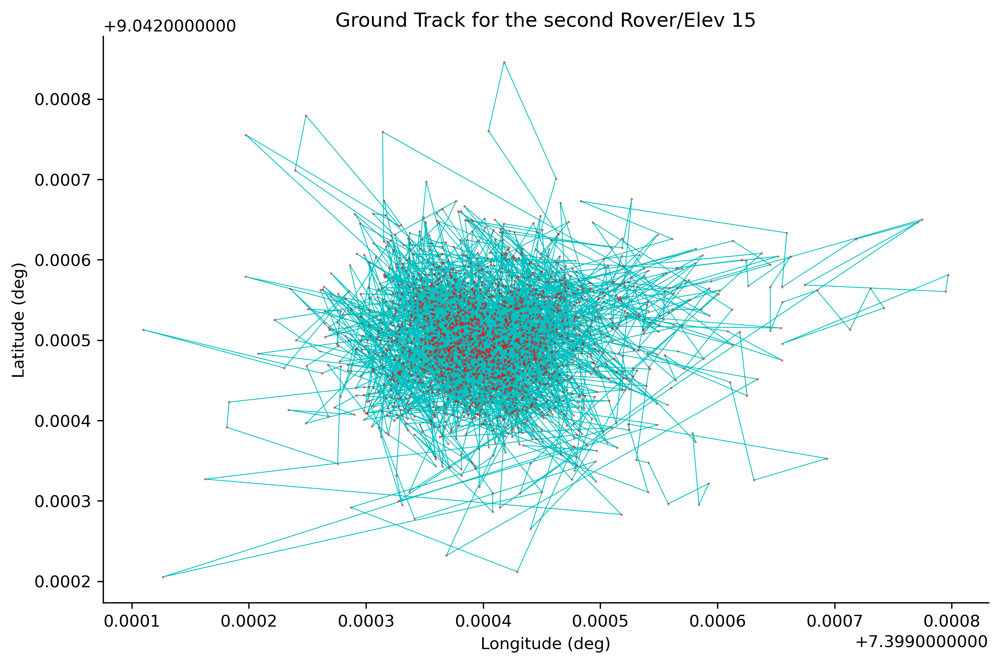

In [36]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(RoverData_Elev15['longitude(deg)'], RoverData_Elev15['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(RoverData_Elev15['longitude(deg)'], RoverData_Elev15['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
#plt.ylim(8.7, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the second Rover/Elev 15')

plt.show()

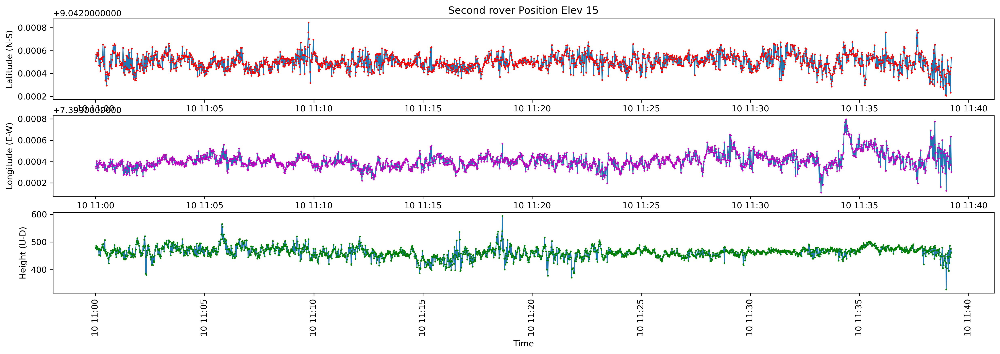

In [37]:
fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(date_time, RoverData_Elev15['latitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev15['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second rover Position Elev 15')


plt.subplot(3,1,2)
plt.plot(date_time, RoverData_Elev15['longitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev15['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(date_time, RoverData_Elev15['height(m)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev15['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

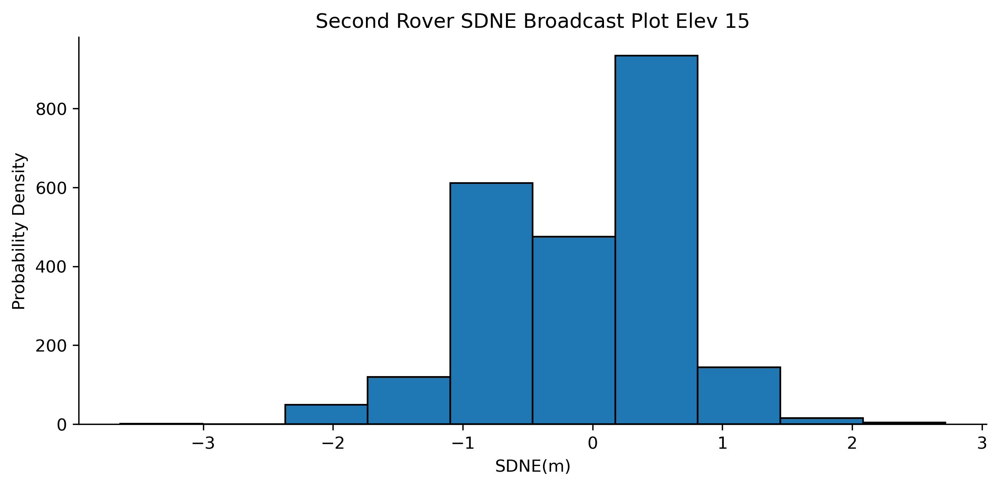

In [38]:
mean = np.mean(RoverData_Elev15['sdne(m)'])
sd = np.std(RoverData_Elev15['sdne(m)'])
pdf = norm.pdf(RoverData_Elev15['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(RoverData_Elev15['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Rover SDNE Broadcast Plot Elev 15')

plt.show()

### Rover Static Positioning 20 deg

In [39]:
# Rover data with 20 deg Elavation angle
RoverData_Elev20 = pd.read_fwf("Data\Data2\Rover2StaticObs11_10_20Elev.pos", skiprows = 13)
RoverData_Elev20.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042507,7.399355,479.1250,5,15,2.5793,2.4801,7.0726,0.8557,1.7337,2.6103,0.0,0.0
1,2022/11/10,11:00:01.416,9.042568,7.399336,486.6195,5,15,2.5793,2.4801,7.0734,0.8555,1.7339,2.6104,0.0,0.0
2,2022/11/10,11:00:02.416,9.042534,7.399384,483.4896,5,15,2.5793,2.4801,7.0742,0.8553,1.7340,2.6105,0.0,0.0
3,2022/11/10,11:00:03.416,9.042565,7.399405,472.9055,5,14,2.6080,2.6599,7.1913,0.6000,2.0605,2.5136,0.0,0.0
4,2022/11/10,11:00:04.416,9.042582,7.399358,473.8177,5,15,2.5792,2.4802,7.0757,0.8548,1.7344,2.6107,0.0,0.0


In [40]:
RoverData_Elev20.rename(columns={'Unnamed: 1': 'time_3'}, inplace= True )
RoverData_Elev20.head()

,% GPST,time_3,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042507,7.399355,479.1250,5,15,2.5793,2.4801,7.0726,0.8557,1.7337,2.6103,0.0,0.0
1,2022/11/10,11:00:01.416,9.042568,7.399336,486.6195,5,15,2.5793,2.4801,7.0734,0.8555,1.7339,2.6104,0.0,0.0
2,2022/11/10,11:00:02.416,9.042534,7.399384,483.4896,5,15,2.5793,2.4801,7.0742,0.8553,1.7340,2.6105,0.0,0.0
3,2022/11/10,11:00:03.416,9.042565,7.399405,472.9055,5,14,2.6080,2.6599,7.1913,0.6000,2.0605,2.5136,0.0,0.0
4,2022/11/10,11:00:04.416,9.042582,7.399358,473.8177,5,15,2.5792,2.4802,7.0757,0.8548,1.7344,2.6107,0.0,0.0


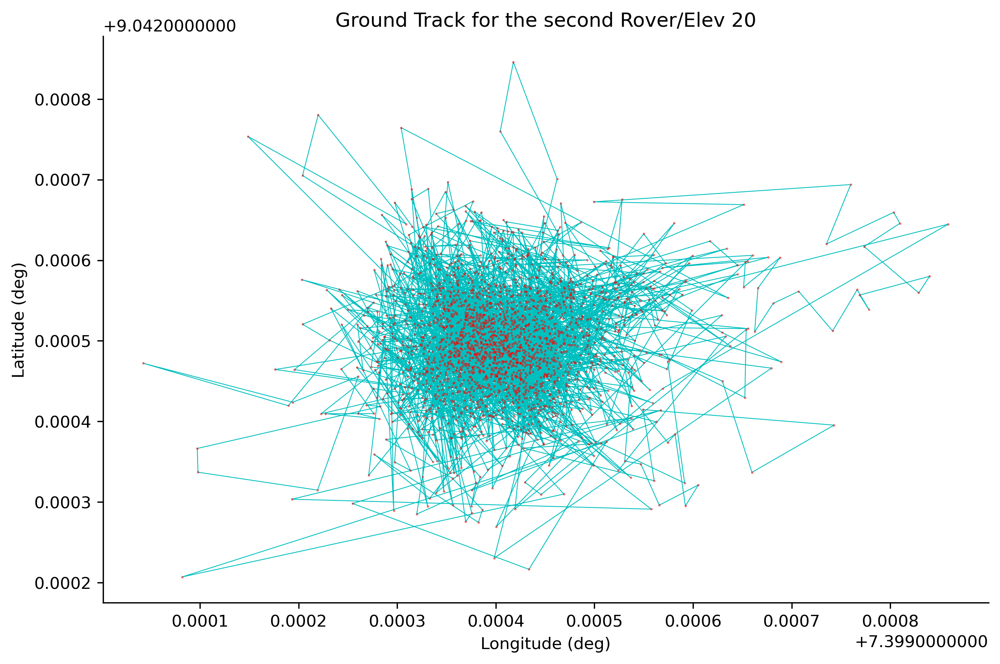

In [41]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(RoverData_Elev20['longitude(deg)'], RoverData_Elev20['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(RoverData_Elev20['longitude(deg)'], RoverData_Elev20['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
#plt.ylim(8.7, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the second Rover/Elev 20')

plt.show()

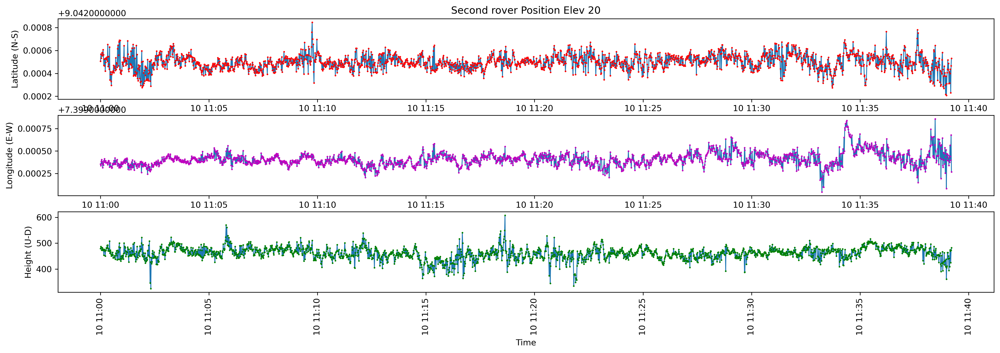

In [42]:
fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(date_time, RoverData_Elev20['latitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev20['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second rover Position Elev 20')


plt.subplot(3,1,2)
plt.plot(date_time, RoverData_Elev20['longitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev20['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(date_time, RoverData_Elev20['height(m)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev20['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

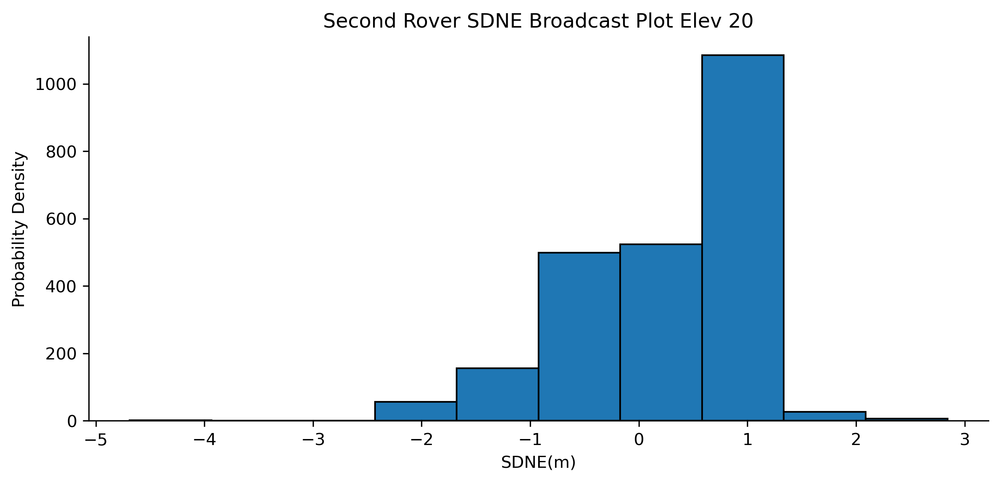

In [43]:
mean = np.mean(RoverData_Elev20['sdne(m)'])
sd = np.std(RoverData_Elev20['sdne(m)'])
pdf = norm.pdf(RoverData_Elev20['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(RoverData_Elev20['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Rover SDNE Broadcast Plot Elev 20')

plt.show()

### Rover Static Positioning 30 deg

In [44]:
# Rover data with 30 deg Elavation angle
RoverData_Elev30 = pd.read_fwf("Data\Data2\Rover2StaticObs11_10_30Elev.pos", skiprows = 13)
RoverData_Elev30.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042518,7.399391,473.9976,5,10,3.1019,4.0200,9.8662,2.1196,2.3348,1.2310,0.0,0.0
1,2022/11/10,11:00:01.416,9.042567,7.399323,482.1327,5,10,3.1017,4.0196,9.8674,2.1191,2.3354,1.2317,0.0,0.0
2,2022/11/10,11:00:02.416,9.042533,7.399380,476.0956,5,10,3.1015,4.0193,9.8687,2.1185,2.3360,1.2324,0.0,0.0
3,2022/11/10,11:00:03.416,9.042532,7.399310,471.9610,5,9,3.1067,4.9208,10.1597,2.2371,3.5070,1.4002,0.0,0.0
4,2022/11/10,11:00:04.416,9.042561,7.399315,478.8846,5,10,3.1011,4.0186,9.8713,2.1174,2.3372,1.2337,0.0,0.0


In [45]:
RoverData_Elev30.rename(columns={'Unnamed: 1': 'time_4'}, inplace= True )
RoverData_Elev30.head()

,% GPST,time_4,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042518,7.399391,473.9976,5,10,3.1019,4.0200,9.8662,2.1196,2.3348,1.2310,0.0,0.0
1,2022/11/10,11:00:01.416,9.042567,7.399323,482.1327,5,10,3.1017,4.0196,9.8674,2.1191,2.3354,1.2317,0.0,0.0
2,2022/11/10,11:00:02.416,9.042533,7.399380,476.0956,5,10,3.1015,4.0193,9.8687,2.1185,2.3360,1.2324,0.0,0.0
3,2022/11/10,11:00:03.416,9.042532,7.399310,471.9610,5,9,3.1067,4.9208,10.1597,2.2371,3.5070,1.4002,0.0,0.0
4,2022/11/10,11:00:04.416,9.042561,7.399315,478.8846,5,10,3.1011,4.0186,9.8713,2.1174,2.3372,1.2337,0.0,0.0


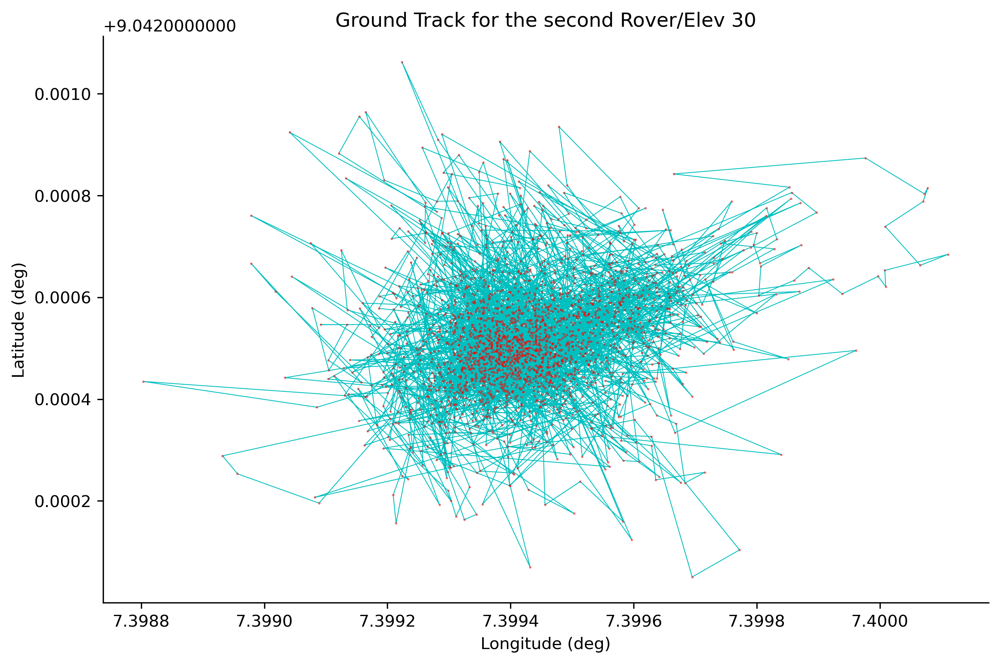

In [46]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(RoverData_Elev30['longitude(deg)'], RoverData_Elev30['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(RoverData_Elev30['longitude(deg)'], RoverData_Elev30['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
#plt.ylim(8.7, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the second Rover/Elev 30')

plt.show()

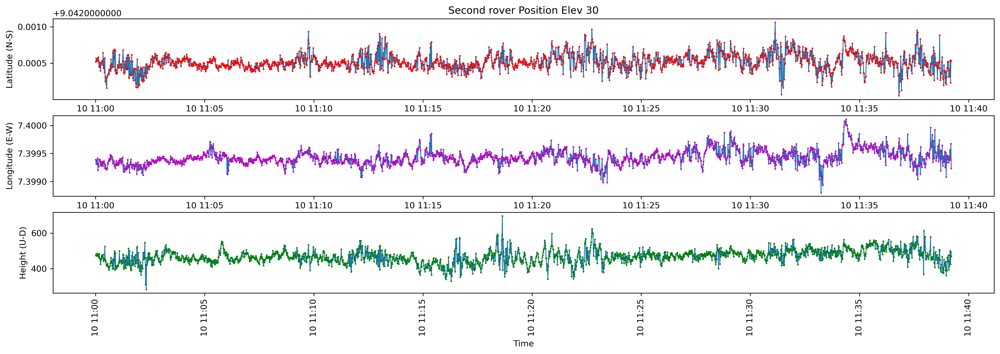

In [47]:
fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(date_time, RoverData_Elev30['latitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev30['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second rover Position Elev 30')


plt.subplot(3,1,2)
plt.plot(date_time, RoverData_Elev30['longitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev30['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(date_time, RoverData_Elev30['height(m)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev30['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

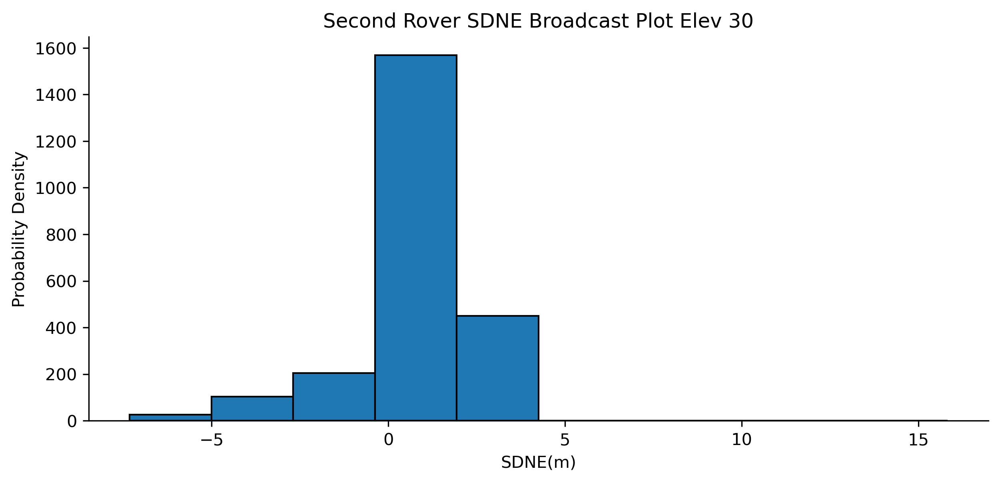

In [48]:
mean = np.mean(RoverData_Elev30['sdne(m)'])
sd = np.std(RoverData_Elev30['sdne(m)'])
pdf = norm.pdf(RoverData_Elev30['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(RoverData_Elev30['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Rover SDNE Broadcast Plot Elev 30')

plt.show()

### CDF Plots for Dilusion of Precision

In [51]:
# Import Satellite and DOP file for each constellation
SatDopFile15 = pd.read_fwf('Data\Data2\Rover2Sats_Dop_ALL11_10_15Elev.txt')
SatDopFile20 = pd.read_fwf('Data\Data2\Rover2Sats_Dop_ALL11_10_20Elev.txt')
SatDopFile30 = pd.read_fwf('Data\Data2\Rover2Sats_Dop_ALL11_10_30Elev.txt')

SatDopFile.head()

,% TIME (GPST),NSAT,GDOP,PDOP,HDOP,VDOP,(EL>=0deg)
0,2022/11/10 11:00:00.4,28,1.2,1.1,0.6,0.9,NaN
1,2022/11/10 11:00:01.4,28,1.2,1.1,0.6,0.9,NaN
2,2022/11/10 11:00:02.4,28,1.2,1.1,0.6,0.9,NaN
3,2022/11/10 11:00:03.4,26,1.3,1.1,0.6,1.0,NaN
4,2022/11/10 11:00:04.4,28,1.2,1.1,0.6,0.9,NaN


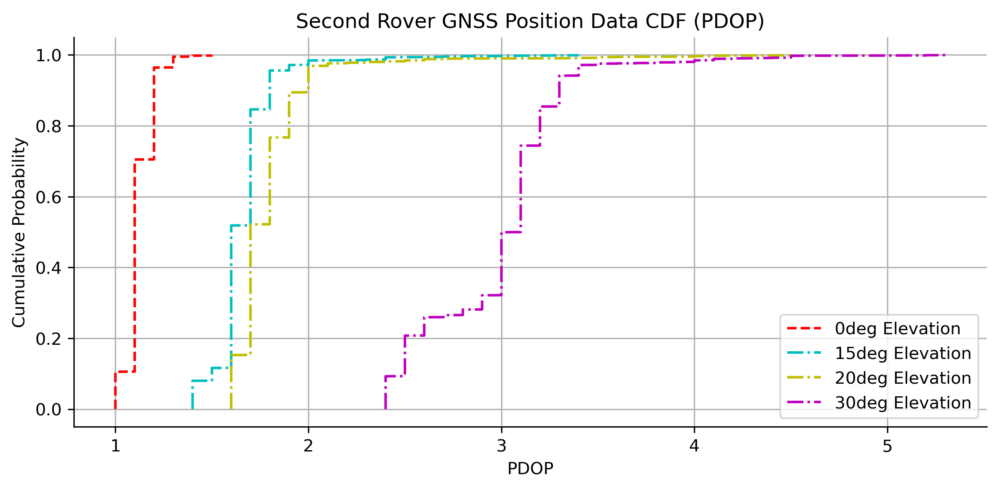

In [52]:
# CDF Plot
CDF_PDOP0 = AllPDOP
CDF_PDOP15 = SatDopFile15['PDOP']
CDF_PDOP20 = SatDopFile20['PDOP']
CDF_PDOP30 = SatDopFile30['PDOP']


sortedCDF_PDOP0 = np.sort(CDF_PDOP0)
yvals_PDOP0 = np.arange(len(sortedCDF_PDOP0))/ float(len(sortedCDF_PDOP0))

sortedCDF_PDOP15 = np.sort(CDF_PDOP15)
yvals_PDOP15 = np.arange(len(sortedCDF_PDOP15))/ float(len(sortedCDF_PDOP15))

sortedCDF_PDOP20 = np.sort(CDF_PDOP20)
yvals_PDOP20 = np.arange(len(sortedCDF_PDOP20))/ float(len(sortedCDF_PDOP20))

sortedCDF_PDOP30 = np.sort(CDF_PDOP30)
yvals_PDOP30 = np.arange(len(sortedCDF_PDOP30))/ float(len(sortedCDF_PDOP30))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_PDOP0, yvals_PDOP0, 'r--', label = '0deg Elevation')
plt.plot(sortedCDF_PDOP15, yvals_PDOP15, 'c-.', label = '15deg Elevation')
plt.plot(sortedCDF_PDOP20, yvals_PDOP20, 'y-.', label = '20deg Elevation')
plt.plot(sortedCDF_PDOP30, yvals_PDOP30, 'm-.', label = '30deg Elevation')

plt.xlabel('PDOP')
plt.ylabel('Cumulative Probability')
plt.title('Second Rover GNSS Position Data CDF (PDOP)')
plt.legend(loc='best')
plt.grid(True)
plt.show()

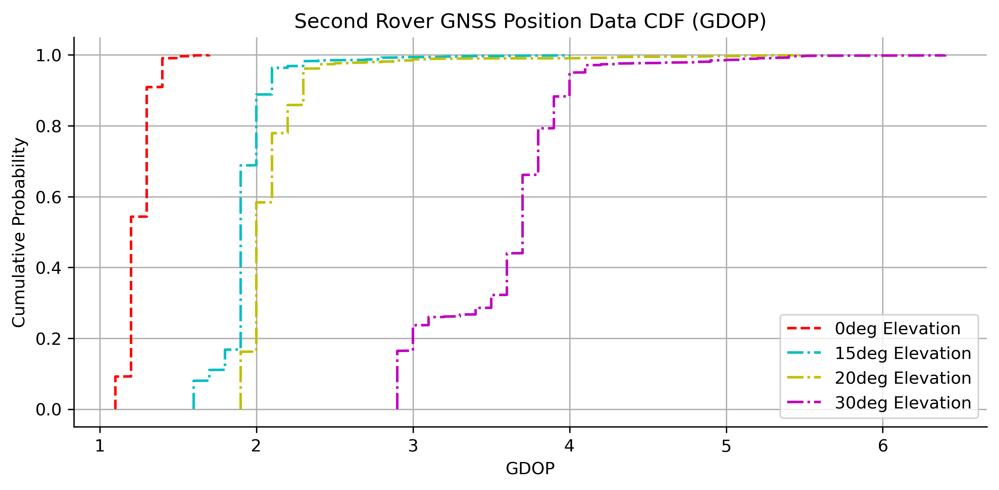

In [53]:
CDF_GDOP0 = SatDopFile['GDOP']
CDF_GDOP15 = SatDopFile15['GDOP']
CDF_GDOP20 = SatDopFile20['GDOP']
CDF_GDOP30 = SatDopFile30['GDOP']

sortedCDF_GDOP0 = np.sort(CDF_GDOP0)
yvals_GDOP0 = np.arange(len(sortedCDF_GDOP0))/ float(len(sortedCDF_GDOP0))

sortedCDF_GDOP15 = np.sort(CDF_GDOP15)
yvals_GDOP15 = np.arange(len(sortedCDF_GDOP15))/ float(len(sortedCDF_GDOP15))

sortedCDF_GDOP20 = np.sort(CDF_GDOP20)
yvals_GDOP20 = np.arange(len(sortedCDF_GDOP20))/ float(len(sortedCDF_GDOP20))

sortedCDF_GDOP30 = np.sort(CDF_GDOP30)
yvals_GDOP30 = np.arange(len(sortedCDF_GDOP30))/ float(len(sortedCDF_GDOP30))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_GDOP0, yvals_GDOP0, 'r--', label = '0deg Elevation')
plt.plot(sortedCDF_GDOP15, yvals_GDOP15, 'c-.', label = '15deg Elevation')
plt.plot(sortedCDF_GDOP20, yvals_GDOP20, 'y-.', label = '20deg Elevation')
plt.plot(sortedCDF_GDOP30, yvals_GDOP30, 'm-.', label = '30deg Elevation')

plt.xlabel('GDOP')
plt.ylabel('Cumulative Probability')
plt.title('Second Rover GNSS Position Data CDF (GDOP)')
plt.legend(loc='best')
plt.grid(True)
plt.show()

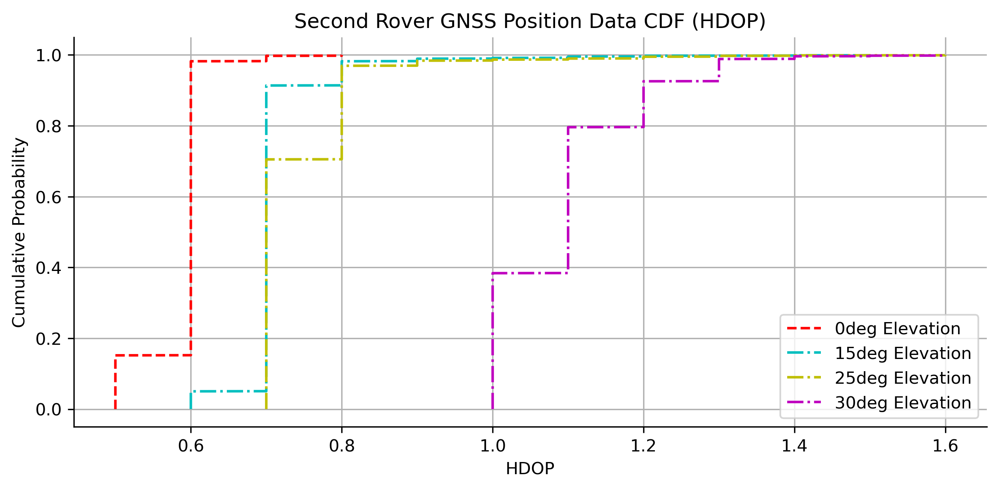

In [54]:
CDF_HDOP0 = SatDopFile['HDOP']
CDF_HDOP15 = SatDopFile15['HDOP']
CDF_HDOP20 = SatDopFile20['HDOP']
CDF_HDOP30 = SatDopFile30['HDOP']

sortedCDF_HDOP0 = np.sort(CDF_HDOP0)
yvals_HDOP0 = np.arange(len(sortedCDF_HDOP0))/ float(len(sortedCDF_HDOP0))

sortedCDF_HDOP15 = np.sort(CDF_HDOP15)
yvals_HDOP15 = np.arange(len(sortedCDF_HDOP15))/ float(len(sortedCDF_HDOP15))

sortedCDF_HDOP20 = np.sort(CDF_HDOP20)
yvals_HDOP20 = np.arange(len(sortedCDF_HDOP20))/ float(len(sortedCDF_HDOP20))

sortedCDF_HDOP30 = np.sort(CDF_HDOP30)
yvals_HDOP30 = np.arange(len(sortedCDF_HDOP30))/ float(len(sortedCDF_HDOP30))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_HDOP0, yvals_HDOP0, 'r--', label = '0deg Elevation')
plt.plot(sortedCDF_HDOP15, yvals_HDOP15, 'c-.', label = '15deg Elevation')
plt.plot(sortedCDF_HDOP20, yvals_HDOP20, 'y-.', label = '25deg Elevation')
plt.plot(sortedCDF_HDOP30, yvals_HDOP30, 'm-.', label = '30deg Elevation')

plt.xlabel('HDOP')
plt.ylabel('Cumulative Probability')
plt.title('Second Rover GNSS Position Data CDF (HDOP)')
plt.legend(loc='best')
plt.grid(True)
plt.show()

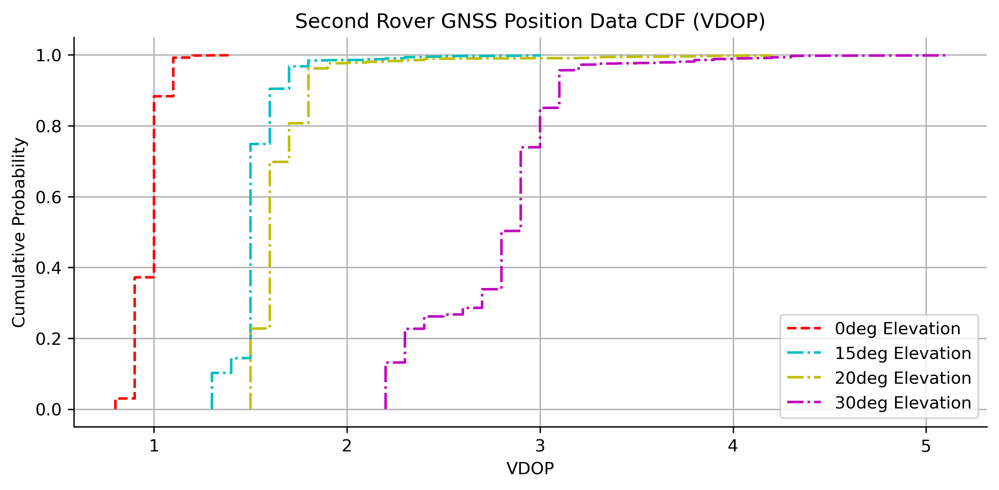

In [55]:
CDF_VDOP0 = SatDopFile['VDOP']
CDF_VDOP15 = SatDopFile15['VDOP']
CDF_VDOP20 = SatDopFile20['VDOP']
CDF_VDOP30 = SatDopFile30['VDOP']

sortedCDF_VDOP0 = np.sort(CDF_VDOP0)
yvals_VDOP0 = np.arange(len(sortedCDF_VDOP0))/ float(len(sortedCDF_VDOP0))

sortedCDF_VDOP15 = np.sort(CDF_VDOP15)
yvals_VDOP15 = np.arange(len(sortedCDF_VDOP15))/ float(len(sortedCDF_VDOP15))

sortedCDF_VDOP20 = np.sort(CDF_VDOP20)
yvals_VDOP20 = np.arange(len(sortedCDF_VDOP20))/ float(len(sortedCDF_VDOP20))

sortedCDF_VDOP30 = np.sort(CDF_VDOP30)
yvals_VDOP30 = np.arange(len(sortedCDF_VDOP30))/ float(len(sortedCDF_VDOP30))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_VDOP0, yvals_VDOP0, 'r--', label = '0deg Elevation')
plt.plot(sortedCDF_VDOP15, yvals_VDOP15, 'c-.', label = '15deg Elevation')
plt.plot(sortedCDF_VDOP20, yvals_VDOP20, 'y-.', label = '20deg Elevation')
plt.plot(sortedCDF_VDOP30, yvals_VDOP30, 'm-.', label = '30deg Elevation')

plt.xlabel('VDOP')
plt.ylabel('Cumulative Probability')
plt.title('Second Rover GNSS Position Data CDF (VDOP)')
plt.legend(loc='best')
plt.grid(True)
plt.show()

### PPK Plot using data from Base station and rover

In [56]:
BaseRoverData_Elev0 = pd.read_fwf("Data\Data2\BaseRover2StaticObs11_10_0Elev.pos", skiprows = 24)
BaseRoverData_Elev0.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042483,7.399404,453.2412,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
1,2022/11/10,11:00:01.416,9.042483,7.399404,453.2420,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
2,2022/11/10,11:00:02.416,9.042483,7.399404,453.2448,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
3,2022/11/10,11:00:03.416,9.042483,7.399404,453.2412,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
4,2022/11/10,11:00:04.416,9.042483,7.399404,453.2440,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0


In [57]:
BaseRoverData_Elev0.rename(columns={'Unnamed: 1': 'time_5'}, inplace= True )
BaseRoverData_Elev0.head()

,% GPST,time_5,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042483,7.399404,453.2412,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
1,2022/11/10,11:00:01.416,9.042483,7.399404,453.2420,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
2,2022/11/10,11:00:02.416,9.042483,7.399404,453.2448,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
3,2022/11/10,11:00:03.416,9.042483,7.399404,453.2412,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0
4,2022/11/10,11:00:04.416,9.042483,7.399404,453.2440,4,0,0.0218,0.0228,0.0571,0.007,0.0102,0.0171,0.42,0.0


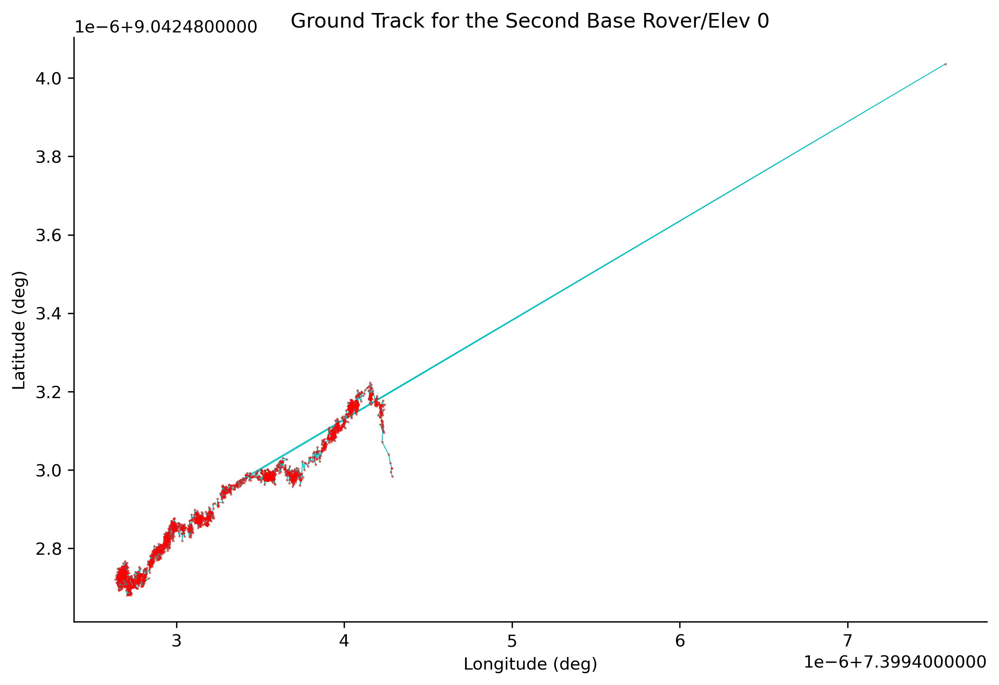

In [58]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(BaseRoverData_Elev0['longitude(deg)'], BaseRoverData_Elev0['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(BaseRoverData_Elev0['longitude(deg)'], BaseRoverData_Elev0['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
# plt.ylim(8.8, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the Second Base Rover/Elev 0')

plt.show()

In [59]:
# Extract time column
BaseSatTime = BaseRoverData_Elev0['time_5']

from datetime import datetime

# The format in which the string represents a date and time
Base_date_format = "%H:%M:%S.%f"

Base_date_time = []
for i in range(len(BaseSatTime)):
    # Convert the string to a datetime object
    date = datetime.strptime(BaseSatTime[i], Base_date_format)
    # Extract the time from the datetime object
    #date = date.strftime('%X')
    Base_date_time.append(date)

# Base_date_time.head()

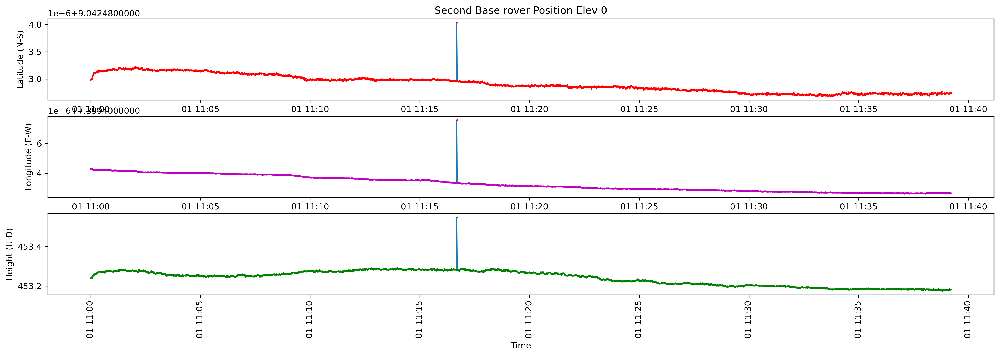

In [60]:
import matplotlib.dates as mdates

fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(Base_date_time, BaseRoverData_Elev0['latitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev0['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second Base rover Position Elev 0')


plt.subplot(3,1,2)
plt.plot(Base_date_time, BaseRoverData_Elev0['longitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev0['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(Base_date_time, BaseRoverData_Elev0['height(m)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev0['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

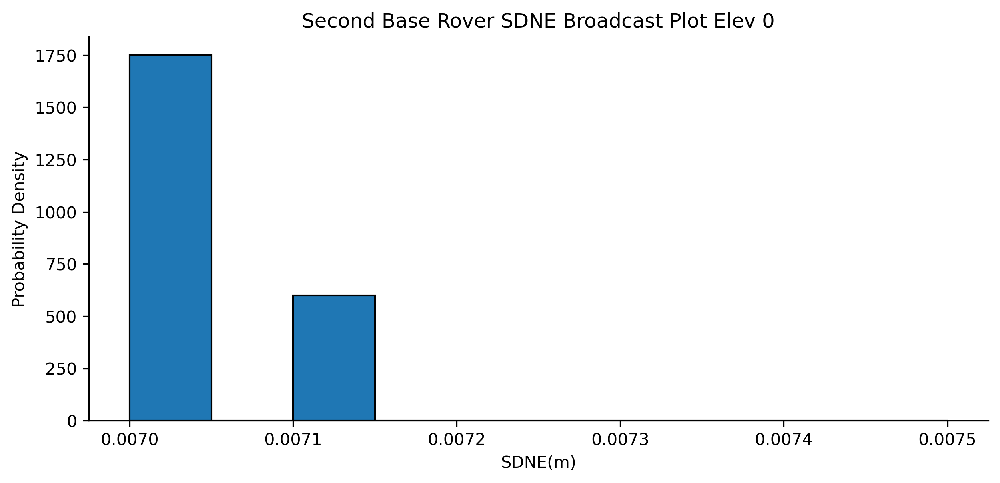

In [61]:
#import seaborn as sb
from scipy.stats import norm

mean = np.mean(BaseRoverData_Elev0['sdne(m)'])
sd = np.std(BaseRoverData_Elev0['sdne(m)'])
pdf = norm.pdf(BaseRoverData_Elev0['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(BaseRoverData_Elev0['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Base Rover SDNE Broadcast Plot Elev 0')

plt.show()

### Base Rover positioning Elev 15

In [62]:
BaseRoverData_Elev15 = pd.read_fwf("Data\Data2\BaseRover2StaticObs11_10_15Elev.pos", skiprows = 24)
BaseRoverData_Elev15.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042484,7.399406,453.9568,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
1,2022/11/10,11:00:01.416,9.042484,7.399406,453.9588,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
2,2022/11/10,11:00:02.416,9.042484,7.399406,453.9630,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
3,2022/11/10,11:00:03.416,9.042484,7.399406,453.9601,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
4,2022/11/10,11:00:04.416,9.042484,7.399406,453.9609,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0


In [63]:
BaseRoverData_Elev15.rename(columns={'Unnamed: 1': 'time_6'}, inplace= True )
BaseRoverData_Elev15.head()

,% GPST,time_6,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042484,7.399406,453.9568,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
1,2022/11/10,11:00:01.416,9.042484,7.399406,453.9588,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
2,2022/11/10,11:00:02.416,9.042484,7.399406,453.9630,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
3,2022/11/10,11:00:03.416,9.042484,7.399406,453.9601,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0
4,2022/11/10,11:00:04.416,9.042484,7.399406,453.9609,4,0,0.0237,0.0239,0.0683,0.0088,0.0177,0.0242,0.42,0.0


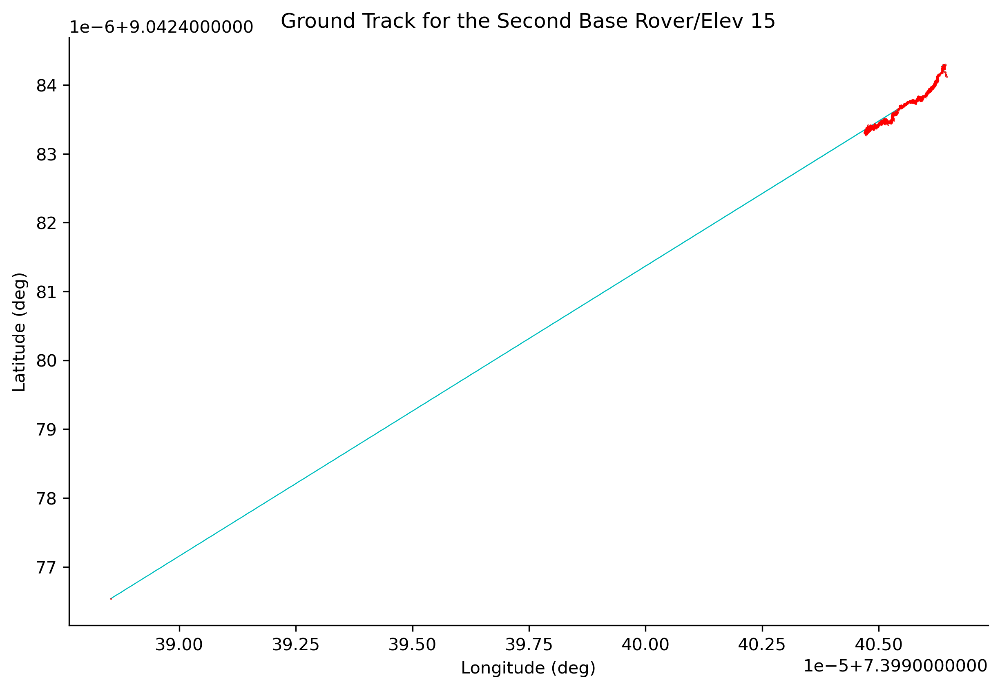

In [64]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(BaseRoverData_Elev15['longitude(deg)'], BaseRoverData_Elev15['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(BaseRoverData_Elev15['longitude(deg)'], BaseRoverData_Elev15['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
# plt.ylim(8.8, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the Second Base Rover/Elev 15')

plt.show()

In [66]:
# Extract time column
BaseSatTime15 = BaseRoverData_Elev15['time_6']

from datetime import datetime

# The format in which the string represents a date and time
Base_date_format = "%H:%M:%S.%f"

Base_date_time = []
for i in range(len(BaseSatTime15)):
    # Convert the string to a datetime object
    date = datetime.strptime(BaseSatTime15[i], Base_date_format)
    # Extract the time from the datetime object
    #date = date.strftime('%X')
    Base_date_time.append(date)

# Base_date_time.head()

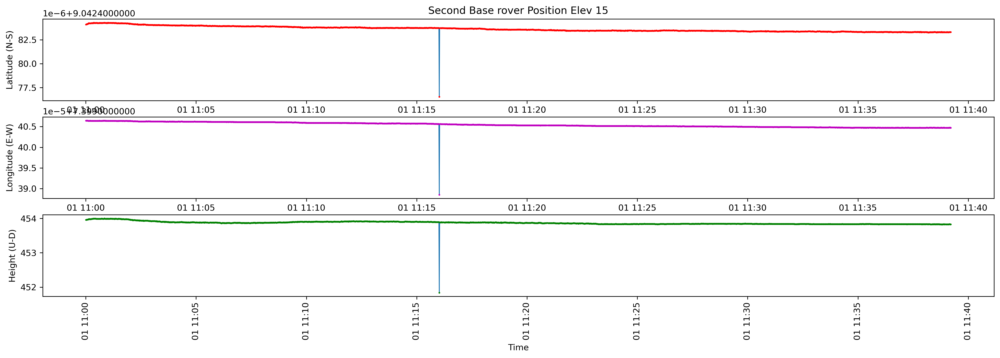

In [67]:
import matplotlib.dates as mdates

fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(Base_date_time, BaseRoverData_Elev15['latitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev15['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second Base rover Position Elev 15')


plt.subplot(3,1,2)
plt.plot(Base_date_time, BaseRoverData_Elev15['longitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev15['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(Base_date_time, BaseRoverData_Elev15['height(m)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev15['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

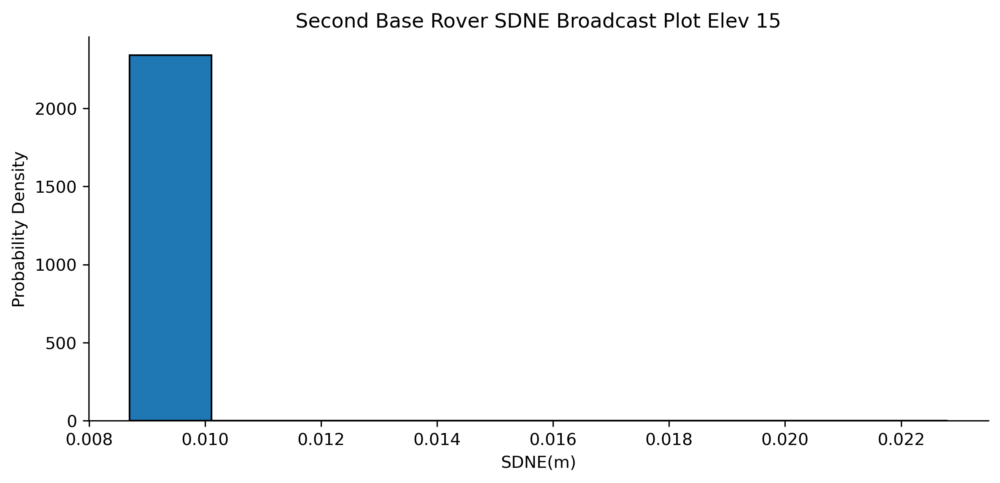

In [68]:
#import seaborn as sb
from scipy.stats import norm

mean = np.mean(BaseRoverData_Elev15['sdne(m)'])
sd = np.std(BaseRoverData_Elev15['sdne(m)'])
pdf = norm.pdf(BaseRoverData_Elev15['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(BaseRoverData_Elev15['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Base Rover SDNE Broadcast Plot Elev 15')

plt.show()

### Base Rover positioning Elev 20

In [69]:
BaseRoverData_Elev20 = pd.read_fwf("Data\Data2\BaseRover2StaticObs11_10_20Elev.pos", skiprows = 24)
BaseRoverData_Elev20.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042484,7.399407,453.7142,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
1,2022/11/10,11:00:01.416,9.042484,7.399407,453.7166,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
2,2022/11/10,11:00:02.416,9.042484,7.399407,453.7212,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
3,2022/11/10,11:00:03.416,9.042484,7.399407,453.7178,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
4,2022/11/10,11:00:04.416,9.042484,7.399407,453.7190,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0


In [70]:
BaseRoverData_Elev20.rename(columns={'Unnamed: 1': 'time_7'}, inplace= True )
BaseRoverData_Elev20.head()

,% GPST,time_7,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042484,7.399407,453.7142,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
1,2022/11/10,11:00:01.416,9.042484,7.399407,453.7166,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
2,2022/11/10,11:00:02.416,9.042484,7.399407,453.7212,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
3,2022/11/10,11:00:03.416,9.042484,7.399407,453.7178,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0
4,2022/11/10,11:00:04.416,9.042484,7.399407,453.7190,4,0,0.024,0.0247,0.073,0.0094,0.0144,0.0247,0.42,0.0


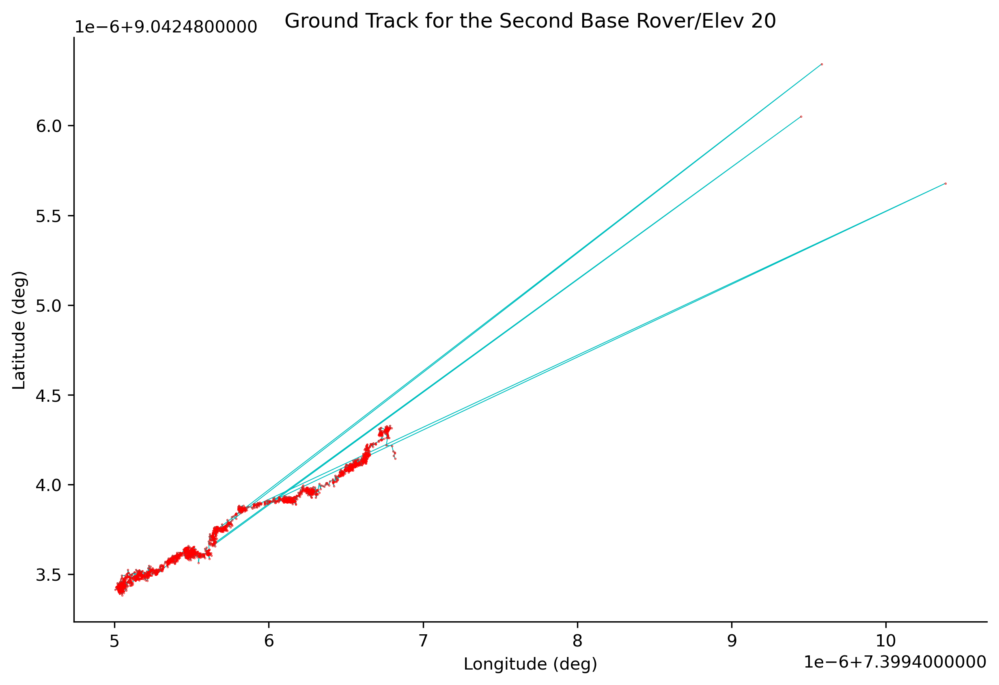

In [71]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(BaseRoverData_Elev20['longitude(deg)'], BaseRoverData_Elev20['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(BaseRoverData_Elev20['longitude(deg)'], BaseRoverData_Elev20['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
# plt.ylim(8.8, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the Second Base Rover/Elev 20')

plt.show()

In [72]:
# Extract time column
BaseSatTime20 = BaseRoverData_Elev20['time_7']

from datetime import datetime

# The format in which the string represents a date and time
Base_date_format = "%H:%M:%S.%f"

Base_date_time = []
for i in range(len(BaseSatTime20)):
    # Convert the string to a datetime object
    date = datetime.strptime(BaseSatTime20[i], Base_date_format)
    # Extract the time from the datetime object
    #date = date.strftime('%X')
    Base_date_time.append(date)

# Base_date_time.head()

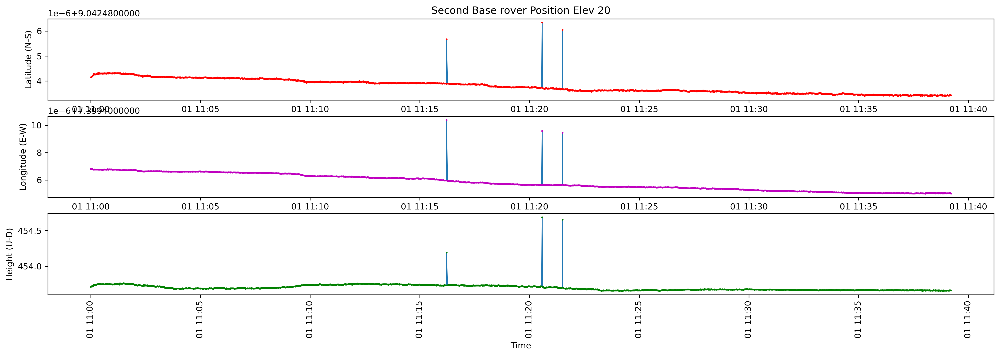

In [73]:
import matplotlib.dates as mdates

fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(Base_date_time, BaseRoverData_Elev20['latitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev20['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second Base rover Position Elev 20')


plt.subplot(3,1,2)
plt.plot(Base_date_time, BaseRoverData_Elev20['longitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev20['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(Base_date_time, BaseRoverData_Elev20['height(m)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev20['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

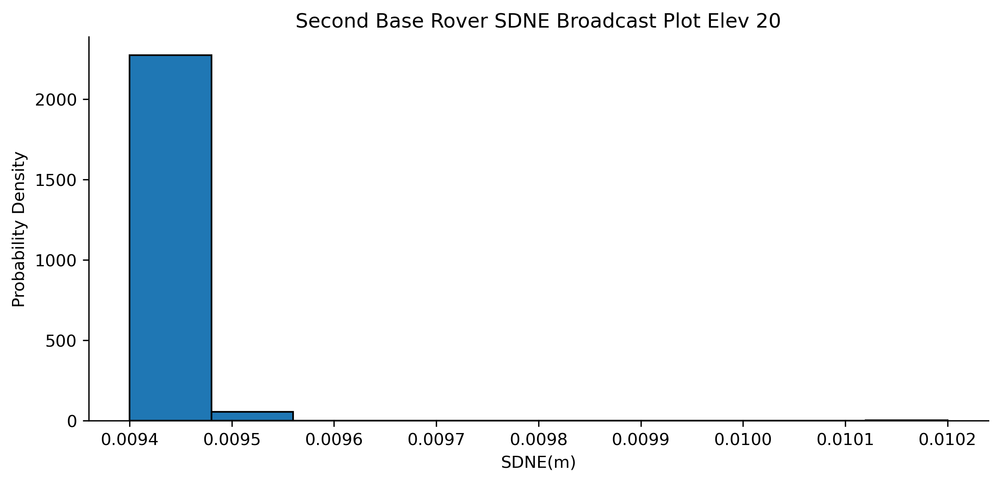

In [74]:
#import seaborn as sb
from scipy.stats import norm

mean = np.mean(BaseRoverData_Elev20['sdne(m)'])
sd = np.std(BaseRoverData_Elev20['sdne(m)'])
pdf = norm.pdf(BaseRoverData_Elev20['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(BaseRoverData_Elev20['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Base Rover SDNE Broadcast Plot Elev 20')

plt.show()

### Base Rover positioning Elev 30

In [75]:
BaseRoverData_Elev30 = pd.read_fwf("Data\Data2\BaseRover2StaticObs11_10_30Elev.pos", skiprows = 24)
BaseRoverData_Elev30.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042493,7.399422,458.1334,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0285,0.42,0.0
1,2022/11/10,11:00:01.416,9.042493,7.399422,458.1386,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0285,0.42,0.0
2,2022/11/10,11:00:02.416,9.042493,7.399422,458.1472,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0284,0.42,0.0
3,2022/11/10,11:00:03.416,9.042493,7.399422,458.1475,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0284,0.42,0.0
4,2022/11/10,11:00:04.416,9.042493,7.399422,458.1500,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0284,0.42,0.0


In [76]:
BaseRoverData_Elev30.rename(columns={'Unnamed: 1': 'time_8'}, inplace= True )
BaseRoverData_Elev30.head()

,% GPST,time_8,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/11/10,11:00:00.416,9.042493,7.399422,458.1334,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0285,0.42,0.0
1,2022/11/10,11:00:01.416,9.042493,7.399422,458.1386,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0285,0.42,0.0
2,2022/11/10,11:00:02.416,9.042493,7.399422,458.1472,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0284,0.42,0.0
3,2022/11/10,11:00:03.416,9.042493,7.399422,458.1475,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0284,0.42,0.0
4,2022/11/10,11:00:04.416,9.042493,7.399422,458.1500,4,0,0.0279,0.0307,0.0996,0.0117,0.0164,0.0284,0.42,0.0


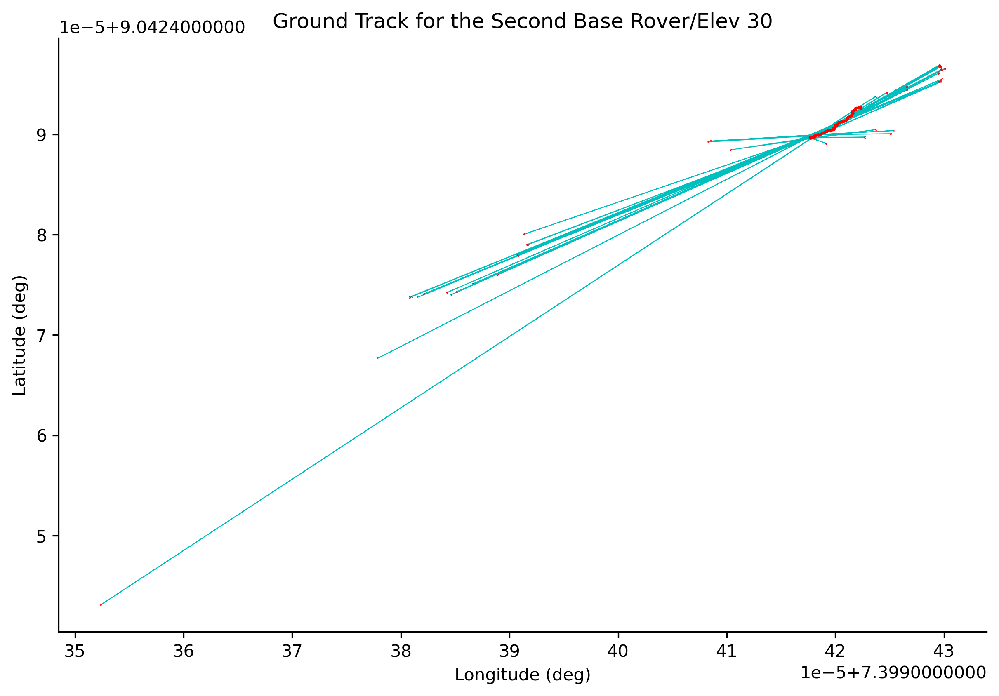

In [77]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(BaseRoverData_Elev30['longitude(deg)'], BaseRoverData_Elev30['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(BaseRoverData_Elev30['longitude(deg)'], BaseRoverData_Elev30['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
# plt.ylim(8.8, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the Second Base Rover/Elev 30')

plt.show()

In [78]:
# Extract time column
BaseSatTime30 = BaseRoverData_Elev30['time_8']

from datetime import datetime

# The format in which the string represents a date and time
Base_date_format = "%H:%M:%S.%f"

Base_date_time = []
for i in range(len(BaseSatTime30)):
    # Convert the string to a datetime object
    date = datetime.strptime(BaseSatTime30[i], Base_date_format)
    # Extract the time from the datetime object
    #date = date.strftime('%X')
    Base_date_time.append(date)

# Base_date_time.head()

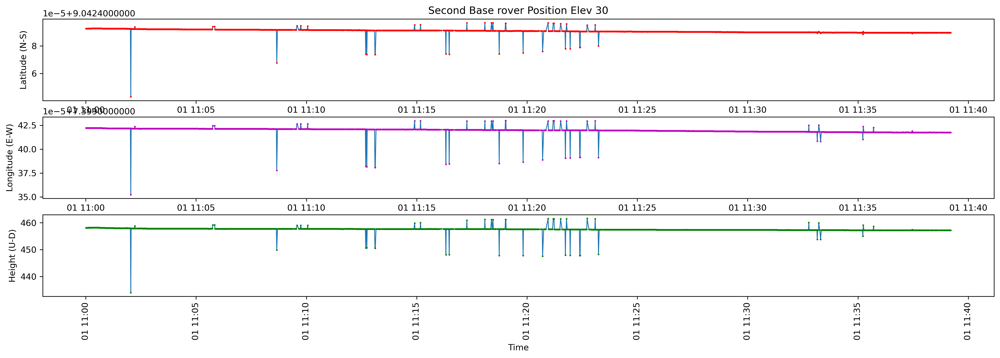

In [79]:
import matplotlib.dates as mdates

fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(Base_date_time, BaseRoverData_Elev30['latitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev30['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Second Base rover Position Elev 30')


plt.subplot(3,1,2)
plt.plot(Base_date_time, BaseRoverData_Elev30['longitude(deg)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev30['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(Base_date_time, BaseRoverData_Elev30['height(m)'], linewidth = 1)
plt.plot(Base_date_time, BaseRoverData_Elev30['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

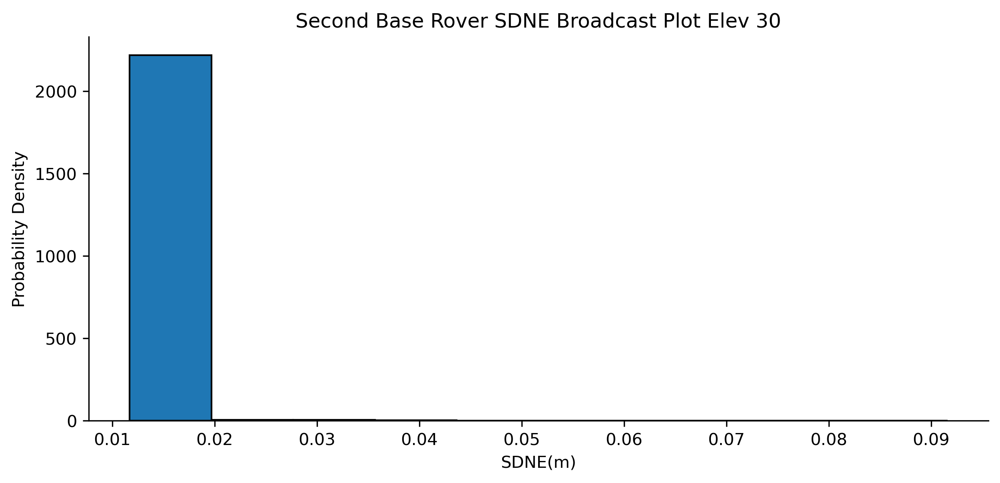

In [80]:
#import seaborn as sb
from scipy.stats import norm

mean = np.mean(BaseRoverData_Elev30['sdne(m)'])
sd = np.std(BaseRoverData_Elev30['sdne(m)'])
pdf = norm.pdf(BaseRoverData_Elev30['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(BaseRoverData_Elev30['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('Second Base Rover SDNE Broadcast Plot Elev 30')

plt.show()